In [1]:
import cv2
from cv2.typing import MatLike
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

#### Funciones Útiles

In [2]:
def load_image(image_path: str) -> MatLike:
	"""Load an image from a specific path

	Args:
		image_path (str): path of the image

	Returns:
		MatLike: image loaded in MatLike format
	"""
	return cv2.imread(image_path, cv2.IMREAD_COLOR_RGB)


def show_images(images_to_show: list[MatLike], titles_from_images: list[str], figsize=(15, 5), images_width=5):
    """Print the images

    Args:
        images_to_show (list[MatLike]): list of images in MatLike format
        titles_from_images (list[str]): list of the title of each image
        figsize (tuple, optional): size of the grafic. Defaults to (15, 5).
        images_width (int, optional): num of images per row, the number must be divisor of the total len. Defaults to 5.
    """
    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(zip(images_to_show, titles_from_images)):
        plt.subplot(len(images_to_show) // images_width, images_width, (i + 1))
        plt.imshow(img, cmap="gray")
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

#### Cargar el dataset

In [3]:
images_path = "./imgs/"

dataset: dict[str, MatLike] = {}
for _, _, images in Path(images_path).walk():
	for image_name in images:
		dataset[image_name] = load_image(images_path + image_name)

print(f"Images loaded: {len(dataset)}")

Images loaded: 10


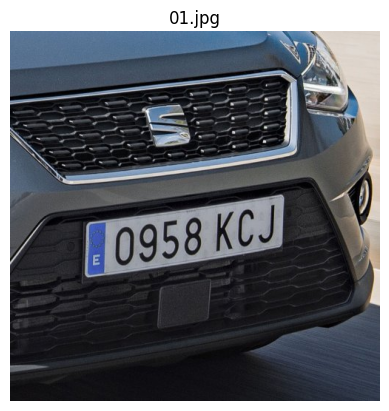

In [4]:
name, img = list(dataset.keys())[0], list(dataset.values())[0]
plt.axis("off")
plt.title(name)
plt.imshow(img)

#### Funciones Espaciales **[ TEMA 7 ]**

In [5]:
def apply_box_filter(image, kernel_size=3):
    return cv2.blur(image, (kernel_size, kernel_size))

    
def apply_gaussian_filter(image, kernel_size=3, sigma=1):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)


def apply_laplacian(image: MatLike):
    return cv2.convertScaleAbs(cv2.Laplacian(image, ddepth=cv2.CV_64F, ksize=3, scale=2))


def apply_sobel(image, direction='x'):
    if direction == 'x':
        image_with_sobel = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    else:
        image_with_sobel = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

    return cv2.convertScaleAbs(image_with_sobel, cv2.CV_64F)


def apply_prewitt(image, direction='x'):
    kernel_x = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
    kernel_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
    if direction == 'x':
        image_with_prewitt = cv2.filter2D(image, -1, kernel_x)
    else:
        image_with_prewitt = cv2.filter2D(image, -1, kernel_y)

    return cv2.convertScaleAbs(image_with_prewitt, cv2.CV_64F)


def apply_roberts(image, direction='x'):
    kernel_x = np.array([[1, 0], [0, -1]])
    kernel_y = np.array([[0, 1], [-1, 0]])

    if direction == 'x':
        image_with_robert =  cv2.filter2D(image, -1, kernel_x)
    else:
        image_with_robert =  cv2.filter2D(image, -1, kernel_y)

    return cv2.convertScaleAbs(image_with_robert, cv2.CV_64F)


def apply_canny(image: MatLike, threshold1=150, threshold2=200):
    return cv2.Canny(image, threshold1, threshold2, L2gradient=True)

#### Funciones Morfológicas **[ TEMA 9 ]**

In [6]:
def apply_erosion(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    return cv2.erode(image, kernel, iterations=1)


def apply_dilation(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    return cv2.dilate(image, kernel, iterations=1)


def apply_opening(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)


def apply_closing(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)


def apply_gradient(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_GRADIENT, kernel)


def apply_tophat(image, kernel_size=10):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_TOPHAT, kernel)

#### Mostrar el efecto de todos los filtros sobre las imagenes del dataset

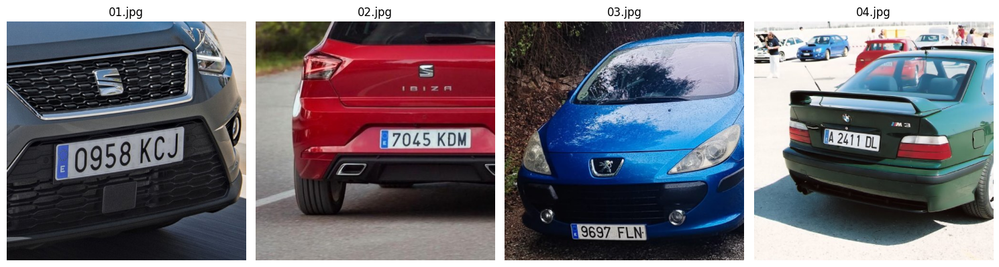

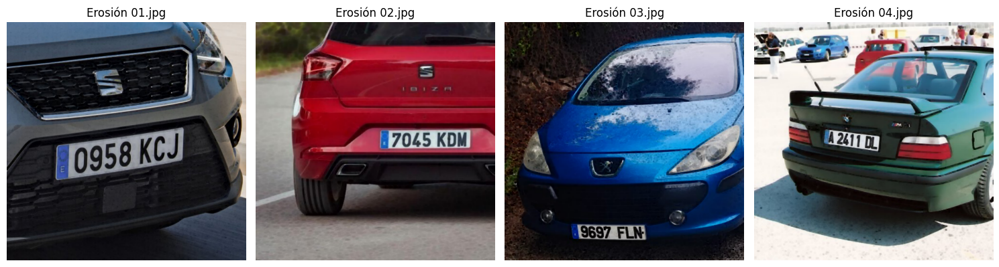

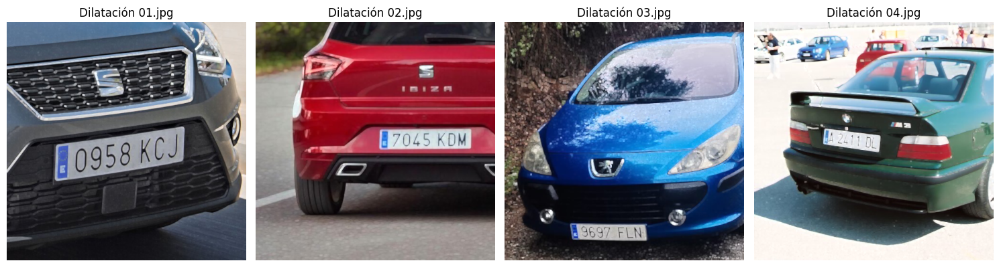

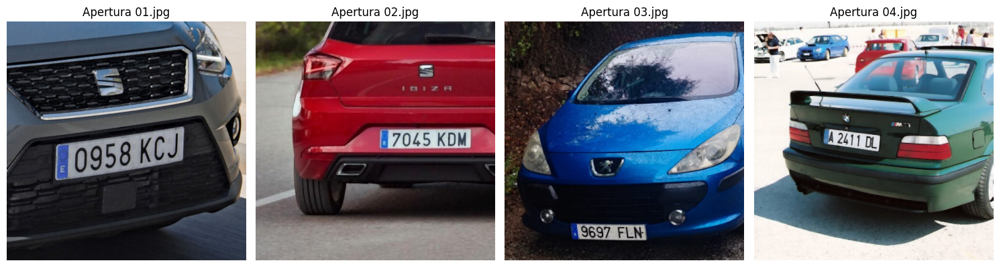

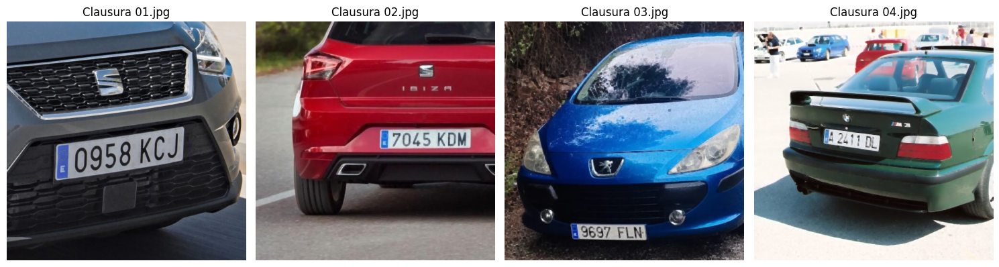

...

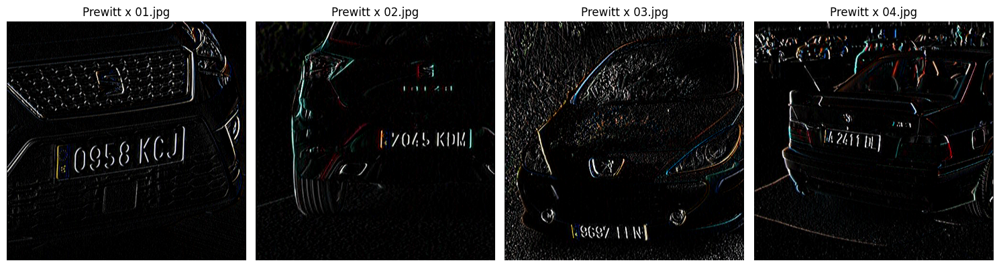

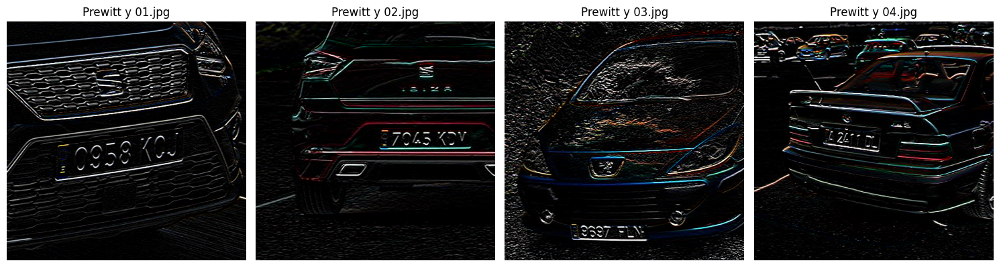

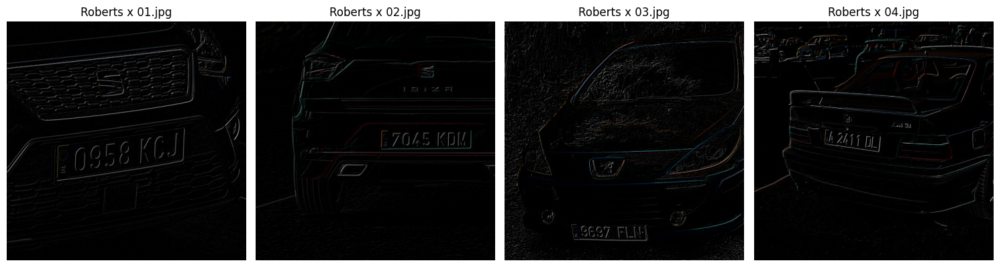

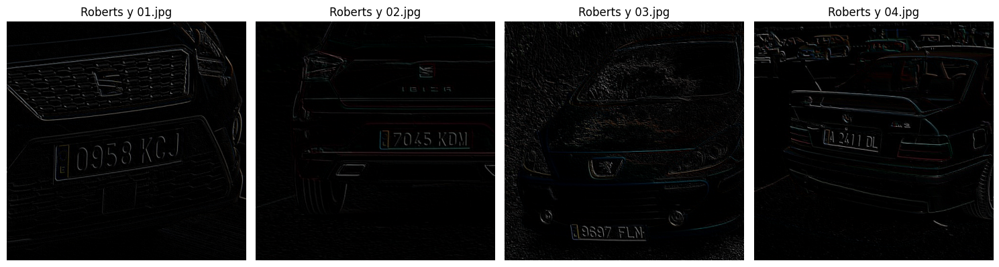

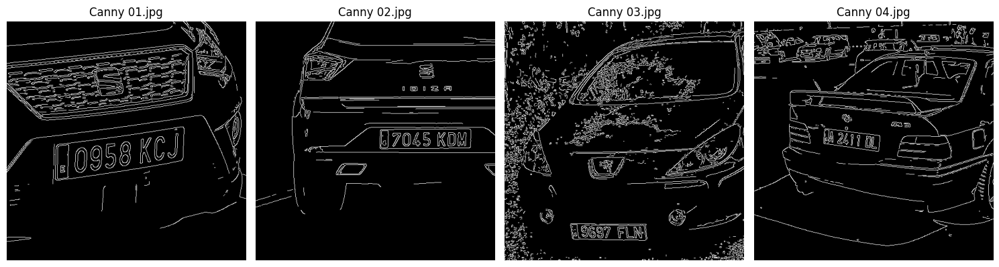

In [8]:
images = []
names = []

for name, image in list(dataset.items())[:4]:
    images.append(image)
    names.append(name)
    
show_images(images, names, images_width=4, figsize=(15, 7))

filters = {
    "Erosión": apply_erosion,
    "Dilatación": apply_dilation,
    "Apertura": apply_opening,
    "Clausura": apply_closing,
    "Gradiente": apply_gradient,
    "Top Hat": apply_tophat,
    "Box Filter": apply_box_filter,
    "Gaussian": apply_gaussian_filter,
    "Laplaciano": apply_laplacian,
    "Sobel x": lambda img: apply_sobel(img, 'x'),
    "Sobel y": lambda img: apply_sobel(img, 'y'),
    "Prewitt x": lambda img: apply_prewitt(img, 'x'),
    "Prewitt y": lambda img: apply_prewitt(img, 'y'),
    "Roberts x": lambda img: apply_roberts(img, 'x'),
    "Roberts y": lambda img: apply_roberts(img, 'y'),
    "Canny": apply_canny
}

for filter_name, filter_func in filters.items():
    results = [filter_func(img) for img in images]
    titles = [f"{filter_name} {name}" for name in names]
    for title, result in zip(titles, results):
        if result.min() < 0 or result.max() > 255:
            print(f"Error: {title}")
    show_images(results, titles, images_width=4, figsize=(15, 7))

#### Proceso para encontrar la mejor combinacion

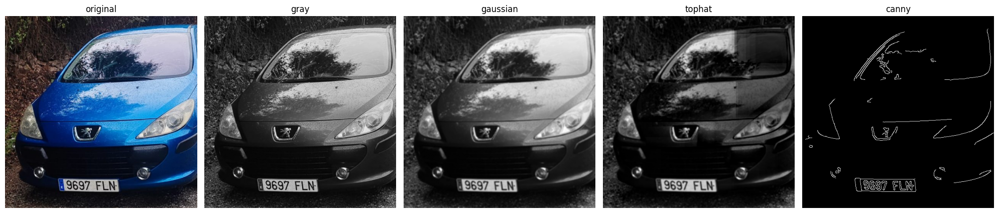

In [56]:
t0 = dataset["03.jpg"]
t1 = cv2.cvtColor(t0, cv2.COLOR_RGB2GRAY) # se pasa a grises para ser tratada mas facilmente, evitando errores por contraste
t2 = apply_gaussian_filter(t1, 5, 1.3)    # se le aplica un filtro gaussiano para facilitar futuros filtros ya que la imagen no queda tan detallada
t3 = apply_tophat(t2, 80)                 # se le aplica el filtro tophat para eliminar detalles inncesarios y remaracar la matricula
t4 = apply_canny(t3,120,255)              # se aplica el filtro canny para detectar bordes

show_images([t0, t1, t2, t3, t4], ["original", "gray", "gaussian", "tophat", "canny"], figsize=(20, 5), images_width=5)

In [45]:
def apply_process(img: MatLike) -> MatLike:
    """Dada una imagen de un coche en la que se pueda ver su matricula, 
    devuelve una imagen tratada para que se pueda apreciar mejor la matricula

    Args:
        img (MatLike): Imagen de un coche en el que se pueda ver su matricula

    Returns:
        MatLike: Imagen tratada, forzando la vision de la matricula
    """
    t1 = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) 
    t2 = apply_gaussian_filter(t1, 5, 1.3)
    t3 = apply_tophat(t2, 80)
    t4 = apply_canny(t3,120,255)
    return t4

In [38]:
def show_license(img: MatLike) -> MatLike:
    """A partir de una imagen, devuelve la imagen con la posible matricula remarcada

    Args:
        img (MatLike): Imagen tratada de coche en la que se pueda ver la matricula

    Returns:
        MatLike: Imagen con la matricula remarcada
    """
    contours = cv2.findContours(img, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0] # devuelve una lista con todos los contornos obtenidos
    draw_cnt = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR) # prepara una imagen a la que se le aplicara el contorno de la matricula

    candidates = []
    for contour in contours:
        _, _, w, h = cv2.boundingRect(contour)
        aspect_ratio = float(w) / h
        if( np.isclose(aspect_ratio, 520/120, atol=2) # contornos con un ratio similar al de las matriculas 
            and 330 > w > 110 and 140 > h > 35):      # medidas arbitrarias seleccionadas para elimnar elementos grandes y pequenos
            candidates.append(contour)
    
    plate = candidates[0] if candidates else None
    for candidate in candidates[1:]:
        _, y1, *_ = cv2.boundingRect(candidate)
        _, y2, *_ = cv2.boundingRect(plate)
        
        plate = candidate if y1 > y2 else plate # me quedo con el contorno mas bajo, es una medida arbitraria, se podria utilizar otra
    
    return cv2.drawContours(draw_cnt, [plate], -1, (0, 255, 0), 2)

In [39]:
def show_contours(img: MatLike) -> MatLike:
    """Muestras los contornos de una imagen dada

    Args:
        img (MatLike): Imagen de la que se quiere obtener los contornos

    Returns:
        MatLike: Imagen original con los contornos remarcados
    """
    contours = cv2.findContours(img, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
    draw_cnt = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

    return cv2.drawContours(draw_cnt, contours, -1, (0, 255, 0), 2)

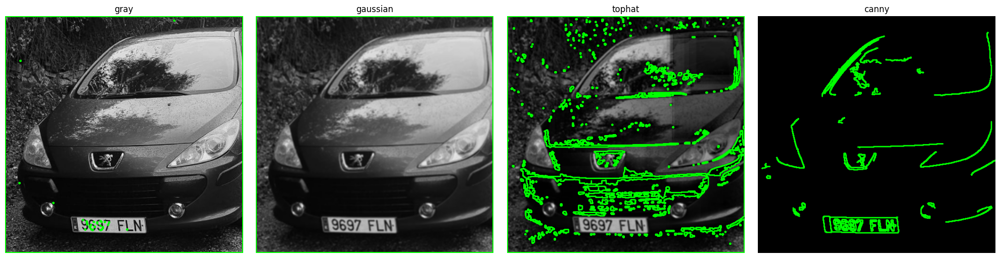

In [44]:
t0 = dataset["03.jpg"]
t1 = cv2.cvtColor(t0, cv2.COLOR_RGB2GRAY) 
t2 = apply_gaussian_filter(t1, 5, 1.3)  
t3 = apply_tophat(t2, 80)          
t4 = apply_canny(t3,120,255)      
        
show_images([show_contours(t1), show_contours(t2), show_contours(t3), show_contours(t4)], 
            ["gray", "gaussian", "tophat", "canny"], figsize=(20, 5), images_width=4)

#### Resultado final aplicado al dataset

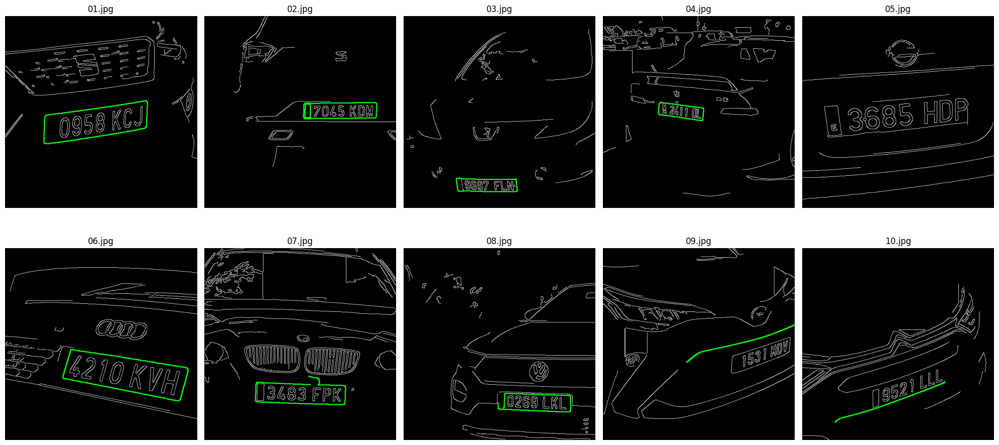

In [41]:
show_images(list(map(lambda x: show_license(apply_process(x)), dataset.values())), list(dataset.keys()), figsize=(20, 10), images_width=5)